In [95]:

import pandas as pd  
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.optimize as sco
import datetime as dt
import math
from datetime import datetime, timedelta
from pandas_datareader import data as wb
from sklearn.cluster import KMeans
np.random.seed(777)


start = '2018-06-30'
end = '2020-06-30'
# N = 90
# start = datetime.now() - timedelta(days=N)
# end = dt.datetime.today()



tickers = ['AXP','AAPL','BA','CAT','CSCO','CVX','XOM','GS','HD','IBM','INTC','JNJ','KO','JPM','MCD','MMM','MRK','MSFT','NKE','PFE','PG','TRV','UNH','RTX','VZ','V','WBA','WMT','DIS','DOW']

thelen = len(tickers)

price_data = []
for ticker in tickers:
    prices = wb.DataReader(ticker, start = start, end = end, data_source='yahoo')[['Adj Close']]
    price_data.append(prices.assign(ticker=ticker)[['ticker', 'Adj Close']])

df = pd.concat(price_data)
df.dtypes
df.head()
df.shape

pd.set_option('display.max_columns', 500)

df = df.reset_index()
df = df.set_index('Date')
table = df.pivot(columns='ticker')
# By specifying col[1] in below list comprehension
# You can select the stock names under multi-level column
table.columns = [col[1] for col in table.columns]
table.head()



,AAPL,AXP,BA,CAT,CSCO,CVX,DIS,DOW,GS,HD,IBM,INTC,JNJ,JPM,KO,MCD,MMM,MRK,MSFT,NKE,PFE,PG,RTX,TRV,UNH,V,VZ,WBA,WMT,XOM
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-07-02,182.199005,95.569061,323.468475,127.839844,40.036884,114.092377,102.433945,NaN,214.488525,184.452301,127.317261,47.870110,115.182602,98.017410,40.983719,149.353378,183.122162,57.121181,97.215668,76.704865,33.782478,73.716858,74.856522,116.646095,239.698334,130.813217,45.796288,57.412075,80.699226,73.935944
2018-07-03,179.025772,94.449265,320.436676,125.532394,39.905952,114.533165,101.179420,NaN,211.721634,184.072021,127.053284,47.173996,116.253143,96.646210,41.208546,148.982056,183.412476,57.357376,96.282494,74.678314,33.801075,73.499847,74.790665,117.008240,239.214035,129.776566,46.050610,57.064583,81.121933,74.369995
2018-07-05,180.466370,95.456833,320.677307,127.389633,40.113304,113.844460,102.443672,NaN,212.067535,184.823059,128.746460,48.394573,118.422646,97.274582,41.836178,149.781830,184.826706,58.236015,96.972656,74.942657,34.284611,74.735840,74.808624,116.846230,242.623367,131.593155,46.577423,58.586052,81.246819,74.433296
2018-07-06,182.967972,95.447128,322.082581,127.014442,40.254673,113.991386,102.718170,NaN,213.076263,184.889572,129.702301,48.985806,119.133179,97.593460,41.817444,151.781189,184.939117,58.765091,98.333542,74.874138,34.507786,74.830200,75.078041,117.399010,242.875183,132.382980,46.759083,59.450096,81.189194,74.451408
2018-07-09,185.508545,96.793785,329.089355,132.229691,40.216972,115.690147,103.933762,NaN,219.032669,186.410721,131.441010,49.453068,119.417397,100.613350,41.592617,152.276276,187.814423,58.595028,99.004250,75.657326,34.554279,73.462105,75.844391,119.514809,245.693680,133.794754,46.621262,59.853943,82.553383,74.966843


Text(0, 0.5, 'price in $')

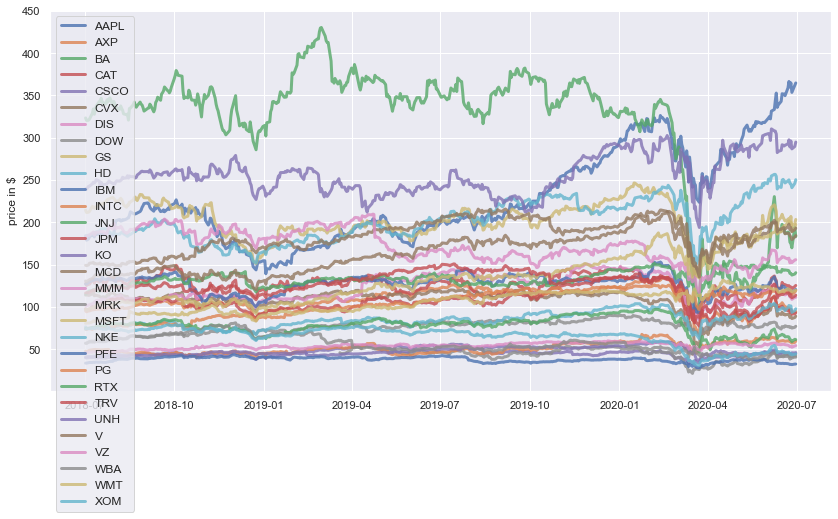

In [99]:

plt.figure(figsize=(14, 7))
for c in table.columns.values:
    plt.plot(table.index, table[c], lw=3, alpha=0.8,label=c)
plt.legend(loc='upper left', fontsize=12)
plt.ylabel('price in $')



Text(0, 0.5, 'daily returns')

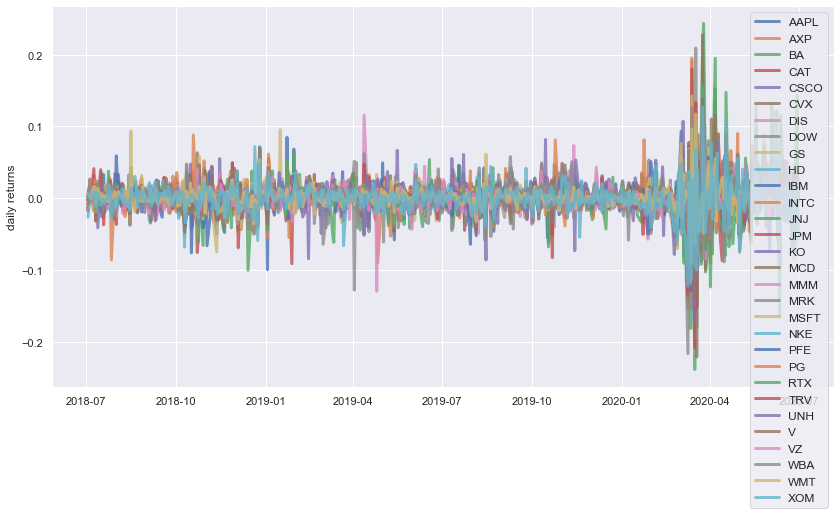

In [101]:

returns = table.pct_change()
plt.figure(figsize=(14, 7))
for c in returns.columns.values:
    plt.plot(returns.index, returns[c], lw=3, alpha=0.8,label=c)
plt.legend(loc='upper right', fontsize=12)
plt.ylabel('daily returns')


-
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.16
Annualised Volatility: 0.25


            AAPL   AXP    BA   CAT  CSCO   CVX   DIS   DOW    GS    HD   IBM  \
allocation  4.76  1.63  1.03  0.26  1.22  0.05  6.86  0.43  1.02  6.42  0.88   

            INTC   JNJ   JPM    KO   MCD   MMM   MRK  MSFT   NKE   PFE    PG  \
allocation  2.56  0.64  4.92  0.27  6.64  4.13  6.99  5.49  4.52  2.35  6.36   

            RTX   TRV   UNH    V    VZ   WBA   WMT  XOM  
allocation  5.3  1.79  0.39  6.8  7.06  0.67  5.98  2.6  
-
Minimum Volatility Portfolio Allocation

Annualised Return: 0.13
Annualised Volatility: 0.24


            AAPL   AXP    BA   CAT  CSCO   CVX   DIS   DOW    GS    HD   IBM  \
allocation  4.43  0.59  0.59  1.01  1.69  0.56  1.04  0.81  0.64  1.44  1.72   

            INTC   JNJ  JPM    KO   MCD   MMM   MRK  MSFT  NKE   PFE    PG  \
allocation  3.43  3.47  2.9  5.43  7.61  4.99  7.78  4.72  2.2  7.13  6.72   

             RTX   TRV   UNH     V    VZ   WBA  

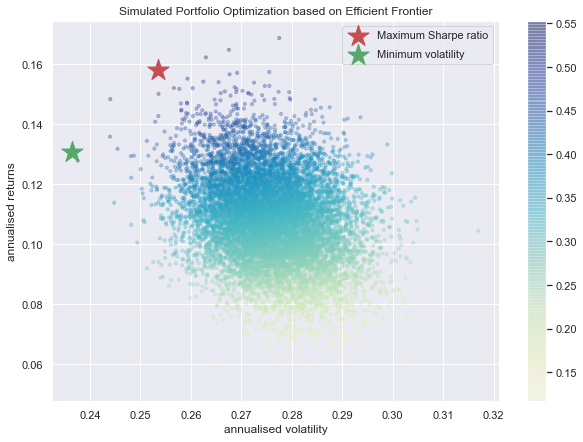

In [102]:

def portfolio_annualised_performance(weights, mean_returns, cov_matrix):
    returns = np.sum(mean_returns*weights ) *252
    std = np.sqrt(np.dot(weights.T, np.dot(cov_matrix, weights))) * np.sqrt(252)
    return std, returns
  
def random_portfolios(num_portfolios, mean_returns, cov_matrix, risk_free_rate):
    results = np.zeros((3,num_portfolios))
    weights_record = []
    for i in range(num_portfolios):
        weights = np.random.random(thelen)
        weights /= np.sum(weights)
        weights_record.append(weights)
        portfolio_std_dev, portfolio_return = portfolio_annualised_performance(weights, mean_returns, cov_matrix)
        results[0,i] = portfolio_std_dev
        results[1,i] = portfolio_return
        results[2,i] = (portfolio_return - risk_free_rate) / portfolio_std_dev
    return results, weights_record


returns = table.pct_change()
mean_returns = returns.mean()
cov_matrix = returns.cov()
num_portfolios = 10000
risk_free_rate = 0.0178



def display_simulated_ef_with_random(mean_returns, cov_matrix, num_portfolios, risk_free_rate):
    results, weights = random_portfolios(num_portfolios,mean_returns, cov_matrix, risk_free_rate)
    
    max_sharpe_idx = np.argmax(results[2])
    sdp, rp = results[0,max_sharpe_idx], results[1,max_sharpe_idx]
    max_sharpe_allocation = pd.DataFrame(weights[max_sharpe_idx],index=table.columns,columns=['allocation'])
    max_sharpe_allocation.allocation = [round(i*100,2)for i in max_sharpe_allocation.allocation]
    max_sharpe_allocation = max_sharpe_allocation.T
    
    min_vol_idx = np.argmin(results[0])
    sdp_min, rp_min = results[0,min_vol_idx], results[1,min_vol_idx]
    min_vol_allocation = pd.DataFrame(weights[min_vol_idx],index=table.columns,columns=['allocation'])
    min_vol_allocation.allocation = [round(i*100,2)for i in min_vol_allocation.allocation]
    min_vol_allocation = min_vol_allocation.T
    
    print("-")
    print("Maximum Sharpe Ratio Portfolio Allocation\n")
    print("Annualised Return:", round(rp,2))
    print("Annualised Volatility:", round(sdp,2))
    print("\n")
    print(max_sharpe_allocation)
    print("-")
    print("Minimum Volatility Portfolio Allocation\n")
    print("Annualised Return:", round(rp_min,2))
    print("Annualised Volatility:", round(sdp_min,2))
    print("\n")
    print(min_vol_allocation)
    
    plt.figure(figsize=(10, 7))
    plt.scatter(results[0,:],results[1,:],c=results[2,:],cmap='YlGnBu', marker='o', s=10, alpha=0.3)
    plt.colorbar()
    plt.scatter(sdp,rp,marker='*',color='r',s=500, label='Maximum Sharpe ratio')
    plt.scatter(sdp_min,rp_min,marker='*',color='g',s=500, label='Minimum volatility')
    plt.title('Simulated Portfolio Optimization based on Efficient Frontier')
    plt.xlabel('annualised volatility')
    plt.ylabel('annualised returns')
    plt.legend(labelspacing=0.8)
    

display_simulated_ef_with_random(mean_returns, cov_matrix, num_portfolios, risk_free_rate)


--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.37
Annualised Volatility: 0.28


             AAPL  AXP   BA  CAT  CSCO  CVX  DIS  DOW   GS   HD  IBM  INTC  \
allocation  17.23  0.0  0.0  0.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0   

            JNJ  JPM   KO  MCD  MMM  MRK   MSFT  NKE  PFE     PG  RTX  TRV  \
allocation  0.0  0.0  0.0  0.0  0.0  0.0  46.32  0.0  0.0  27.81  0.0  0.0   

            UNH    V   VZ  WBA   WMT  XOM  
allocation  0.0  0.0  0.0  0.0  8.64  0.0  
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.14
Annualised Volatility: 0.19


            AAPL  AXP   BA  CAT  CSCO  CVX   DIS  DOW   GS   HD  IBM  INTC  \
allocation   0.0  0.0  0.0  0.0   0.0  0.0  0.34  0.0  0.0  0.0  0.0   0.0   

             JNJ  JPM    KO   MCD   MMM   MRK  MSFT  NKE   PFE   PG  RTX  TRV  \
alloca

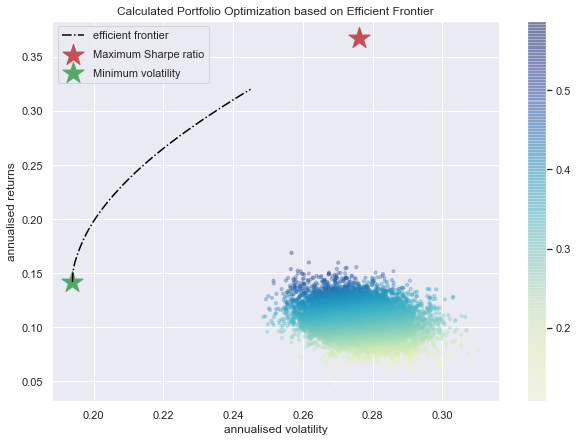

In [103]:

def neg_sharpe_ratio(weights, mean_returns, cov_matrix, risk_free_rate):
    p_var, p_ret = portfolio_annualised_performance(weights, mean_returns, cov_matrix)
    return -(p_ret - risk_free_rate) / p_var

def max_sharpe_ratio(mean_returns, cov_matrix, risk_free_rate):
    num_assets = len(mean_returns)
    args = (mean_returns, cov_matrix, risk_free_rate)
    constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
    bound = (0.0,1.0)
    bounds = tuple(bound for asset in range(num_assets))
    result = sco.minimize(neg_sharpe_ratio, num_assets*[1./num_assets,], args=args,
                        method='SLSQP', bounds=bounds, constraints=constraints)
    return result


def portfolio_volatility(weights, mean_returns, cov_matrix):
    return portfolio_annualised_performance(weights, mean_returns, cov_matrix)[0]

def min_variance(mean_returns, cov_matrix):
    num_assets = len(mean_returns)
    args = (mean_returns, cov_matrix)
    constraints = ({'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
    bound = (0.0,1.0)
    bounds = tuple(bound for asset in range(num_assets))

    result = sco.minimize(portfolio_volatility, num_assets*[1./num_assets,], args=args,
                        method='SLSQP', bounds=bounds, constraints=constraints)

    return result


def efficient_return(mean_returns, cov_matrix, target):
    num_assets = len(mean_returns)
    args = (mean_returns, cov_matrix)

    def portfolio_return(weights):
        return portfolio_annualised_performance(weights, mean_returns, cov_matrix)[1]

    constraints = ({'type': 'eq', 'fun': lambda x: portfolio_return(x) - target},
                   {'type': 'eq', 'fun': lambda x: np.sum(x) - 1})
    bounds = tuple((0,1) for asset in range(num_assets))
    result = sco.minimize(portfolio_volatility, num_assets*[1./num_assets,], args=args, method='SLSQP', bounds=bounds, constraints=constraints)
    return result


def efficient_frontier(mean_returns, cov_matrix, returns_range):
    efficients = []
    for ret in returns_range:
        efficients.append(efficient_return(mean_returns, cov_matrix, ret))
    return efficients
  

def display_calculated_ef_with_random(mean_returns, cov_matrix, num_portfolios, risk_free_rate):
    results, _ = random_portfolios(num_portfolios,mean_returns, cov_matrix, risk_free_rate)
    
    max_sharpe = max_sharpe_ratio(mean_returns, cov_matrix, risk_free_rate)
    sdp, rp = portfolio_annualised_performance(max_sharpe['x'], mean_returns, cov_matrix)
    max_sharpe_allocation = pd.DataFrame(max_sharpe.x,index=table.columns,columns=['allocation'])
    max_sharpe_allocation.allocation = [round(i*100,2)for i in max_sharpe_allocation.allocation]
    max_sharpe_allocation = max_sharpe_allocation.T

    min_vol = min_variance(mean_returns, cov_matrix)
    sdp_min, rp_min = portfolio_annualised_performance(min_vol['x'], mean_returns, cov_matrix)
    min_vol_allocation = pd.DataFrame(min_vol.x,index=table.columns,columns=['allocation'])
    min_vol_allocation.allocation = [round(i*100,2)for i in min_vol_allocation.allocation]
    min_vol_allocation = min_vol_allocation.T
    
    print("-"*80)
    print("Maximum Sharpe Ratio Portfolio Allocation\n")
    print("Annualised Return:", round(rp,2))
    print("Annualised Volatility:", round(sdp,2))
    print("\n")
    print(max_sharpe_allocation)
    print("-"*80)
    print("Minimum Volatility Portfolio Allocation\n")
    print("Annualised Return:", round(rp_min,2))
    print("Annualised Volatility:", round(sdp_min,2))
    print("\n")
    print(min_vol_allocation)
    
    plt.figure(figsize=(10, 7))
    plt.scatter(results[0,:],results[1,:],c=results[2,:],cmap='YlGnBu', marker='o', s=10, alpha=0.3)
    plt.colorbar()
    plt.scatter(sdp,rp,marker='*',color='r',s=500, label='Maximum Sharpe ratio')
    plt.scatter(sdp_min,rp_min,marker='*',color='g',s=500, label='Minimum volatility')

    target = np.linspace(rp_min, 0.32, 50)
    efficient_portfolios = efficient_frontier(mean_returns, cov_matrix, target)
    plt.plot([p['fun'] for p in efficient_portfolios], target, linestyle='-.', color='black', label='efficient frontier')
    plt.title('Calculated Portfolio Optimization based on Efficient Frontier')
    plt.xlabel('annualised volatility')
    plt.ylabel('annualised returns')
    plt.legend(labelspacing=0.8)
    
    
display_calculated_ef_with_random(mean_returns, cov_matrix, num_portfolios, risk_free_rate)    


--------------------------------------------------------------------------------
Maximum Sharpe Ratio Portfolio Allocation

Annualised Return: 0.37
Annualised Volatility: 0.28


             AAPL  AXP   BA  CAT  CSCO  CVX  DIS  DOW   GS   HD  IBM  INTC  \
allocation  17.23  0.0  0.0  0.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0   0.0   

            JNJ  JPM   KO  MCD  MMM  MRK   MSFT  NKE  PFE     PG  RTX  TRV  \
allocation  0.0  0.0  0.0  0.0  0.0  0.0  46.32  0.0  0.0  27.81  0.0  0.0   

            UNH    V   VZ  WBA   WMT  XOM  
allocation  0.0  0.0  0.0  0.0  8.64  0.0  
--------------------------------------------------------------------------------
Minimum Volatility Portfolio Allocation

Annualised Return: 0.14
Annualised Volatility: 0.19


            AAPL  AXP   BA  CAT  CSCO  CVX   DIS  DOW   GS   HD  IBM  INTC  \
allocation   0.0  0.0  0.0  0.0   0.0  0.0  0.34  0.0  0.0  0.0  0.0   0.0   

             JNJ  JPM    KO   MCD   MMM   MRK  MSFT  NKE   PFE   PG  RTX  TRV  \
alloca

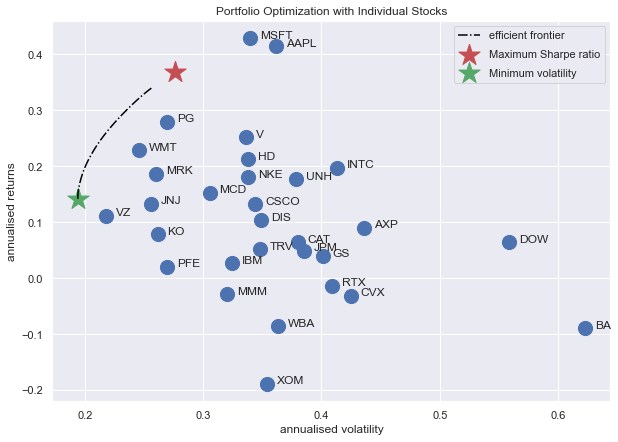

In [116]:

def display_ef_with_selected(mean_returns, cov_matrix, risk_free_rate):
    max_sharpe = max_sharpe_ratio(mean_returns, cov_matrix, risk_free_rate)
    sdp, rp = portfolio_annualised_performance(max_sharpe['x'], mean_returns, cov_matrix)
    max_sharpe_allocation = pd.DataFrame(max_sharpe.x,index=table.columns,columns=['allocation'])
    max_sharpe_allocation.allocation = [round(i*100,2)for i in max_sharpe_allocation.allocation]
    max_sharpe_allocation = max_sharpe_allocation.T

    min_vol = min_variance(mean_returns, cov_matrix)
    sdp_min, rp_min = portfolio_annualised_performance(min_vol['x'], mean_returns, cov_matrix)
    min_vol_allocation = pd.DataFrame(min_vol.x,index=table.columns,columns=['allocation'])
    min_vol_allocation.allocation = [round(i*100,2)for i in min_vol_allocation.allocation]
    min_vol_allocation = min_vol_allocation.T
    
    an_vol = np.std(returns) * np.sqrt(252)
    an_rt = mean_returns * 252
    
    print("-"*80)
    print("Maximum Sharpe Ratio Portfolio Allocation\n")
    print("Annualised Return:", round(rp,2))
    print("Annualised Volatility:", round(sdp,2))
    print("\n")
    print(max_sharpe_allocation)
    print("-"*80)
    print("Minimum Volatility Portfolio Allocation\n")
    print("Annualised Return:", round(rp_min,2))
    print("Annualised Volatility:", round(sdp_min,2))
    print("\n")
    print(min_vol_allocation)
    print("-"*80)
    print("Individual Stock Returns and Volatility\n")
    for i, txt in enumerate(table.columns):
        print(txt,":","annuaised return",round(an_rt[i],2),", annualised volatility:",round(an_vol[i],2))
    print("-"*80)
    
    fig, ax = plt.subplots(figsize=(10, 7))
    ax.scatter(an_vol,an_rt,marker='o',s=200)

    for i, txt in enumerate(table.columns):
        ax.annotate(txt, (an_vol[i],an_rt[i]), xytext=(10,0), textcoords='offset points')
    ax.scatter(sdp,rp,marker='*',color='r',s=500, label='Maximum Sharpe ratio')
    ax.scatter(sdp_min,rp_min,marker='*',color='g',s=500, label='Minimum volatility')

    target = np.linspace(rp_min, 0.34, 50)
    efficient_portfolios = efficient_frontier(mean_returns, cov_matrix, target)
    ax.plot([p['fun'] for p in efficient_portfolios], target, linestyle='-.', color='black', label='efficient frontier')
    ax.set_title('Portfolio Optimization with Individual Stocks')
    ax.set_xlabel('annualised volatility')
    ax.set_ylabel('annualised returns')
    ax.legend(labelspacing=0.8)
    

display_ef_with_selected(mean_returns, cov_matrix, risk_free_rate)


[Text(0.5, 0, 'AAPL'),
 Text(1.5, 0, 'AXP'),
 Text(2.5, 0, 'BA'),
 Text(3.5, 0, 'CAT'),
 Text(4.5, 0, 'CSCO'),
 Text(5.5, 0, 'CVX'),
 Text(6.5, 0, 'DIS'),
 Text(7.5, 0, 'DOW'),
 Text(8.5, 0, 'GS'),
 Text(9.5, 0, 'HD'),
 Text(10.5, 0, 'IBM'),
 Text(11.5, 0, 'INTC'),
 Text(12.5, 0, 'JNJ'),
 Text(13.5, 0, 'JPM'),
 Text(14.5, 0, 'KO'),
 Text(15.5, 0, 'MCD'),
 Text(16.5, 0, 'MMM'),
 Text(17.5, 0, 'MRK'),
 Text(18.5, 0, 'MSFT'),
 Text(19.5, 0, 'NKE'),
 Text(20.5, 0, 'PFE'),
 Text(21.5, 0, 'PG'),
 Text(22.5, 0, 'RTX'),
 Text(23.5, 0, 'TRV'),
 Text(24.5, 0, 'UNH'),
 Text(25.5, 0, 'V'),
 Text(26.5, 0, 'VZ'),
 Text(27.5, 0, 'WBA'),
 Text(28.5, 0, 'WMT'),
 Text(29.5, 0, 'XOM')]

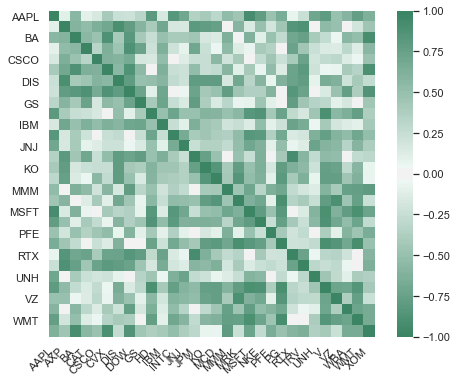

In [118]:

# table.head()

# Draw a heatmap with the numeric values in each cell
corr = table.corr()
#print(corr)


ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(150, 150, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
)


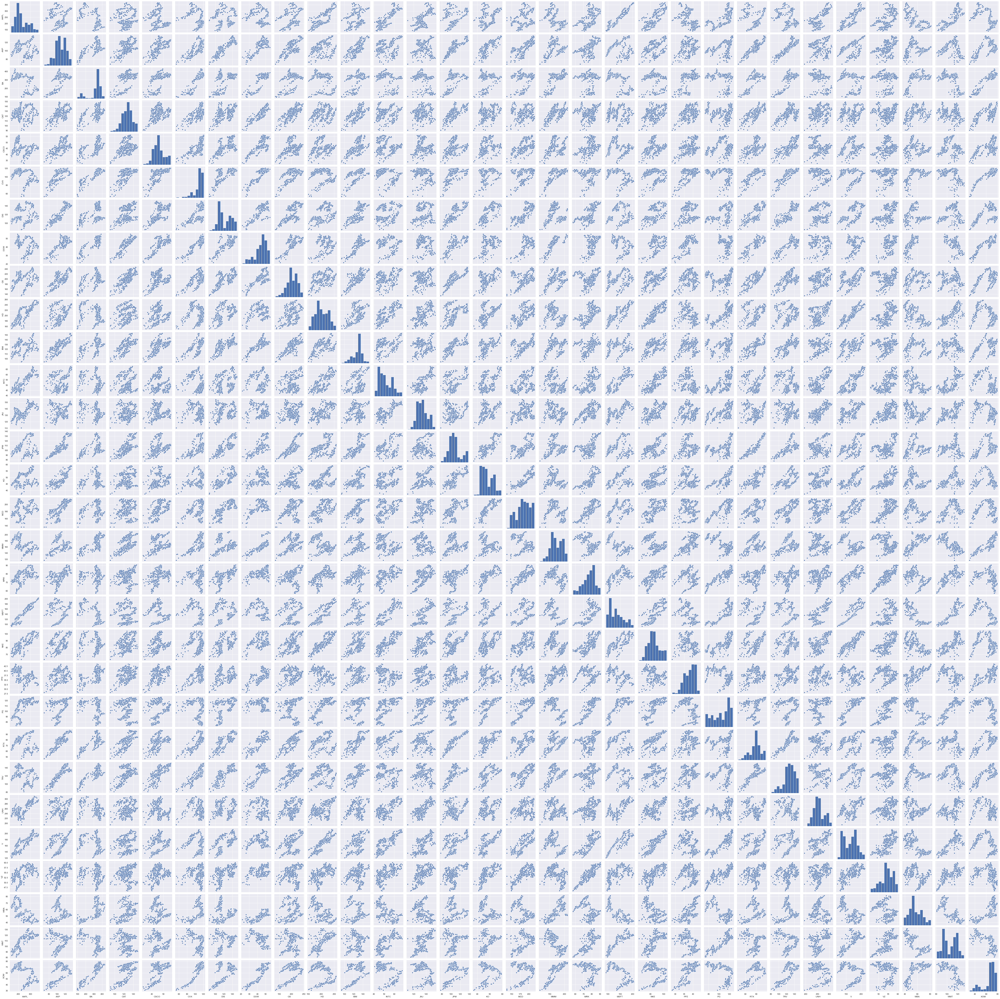

In [119]:

import seaborn as sns
g = sns.pairplot(table)


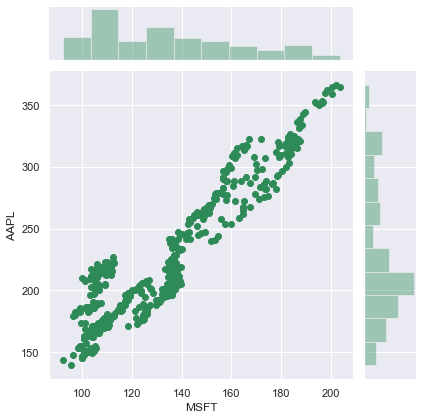

In [143]:

p = sns.jointplot(data=table,x='MSFT', y='AAPL', kind='scatter', color='seagreen')



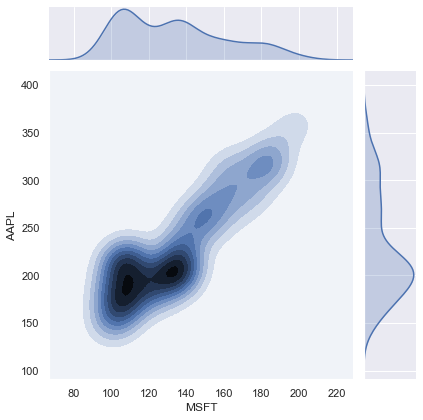

In [145]:

p = sns.jointplot(data=table,x='MSFT', y='AAPL', kind='kde')



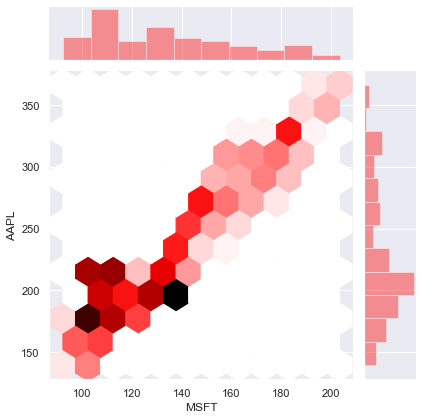

In [146]:

p = sns.jointplot(data=table,x='MSFT', y='AAPL', kind='hex', color='red')



In [ ]:

# data:
# All data was imported for Yahoo Finance.  Yahoo's data is sourced from Capital IQ.
